First of all we have imported some packages to start with.

In [184]:
import googlemaps
import numpy as np
import pandas as pd
import math
import re

Below is the function to get coordinates of the restaurants by address field using the googlemaps-api. 


In [185]:
KEY = 'AIzaaaaaddkjsfhsfhuuweiruweiruwe' 
#changed key before submitting
gmaps = googlemaps.Client(key=KEY)

def get_coordinates(address):
    city = 'Bangalore, India'
    geocode_result = gmaps.geocode(str(address) +' '+ city)
    if len(geocode_result) > 0:
        return list(geocode_result[0]['geometry']['location'].values())
    else:
        return [np.NaN, np.NaN]

Reading the data provided and transforming some fields like rating and votes into a scaled numerical field ranging between 0 to 5  : 

In [186]:
df2=pd.read_csv('zomato.csv')
df2[['rate_5','out_of']]=df2.rate.str.split('/',expand=True)
df2.rate_5=df2.rate_5.fillna('0')

__Concept of Score :__
1. We want to consider both number of votes and average rating as a measure success of a restaurant.
2. So, first we convert both into same and intitutive scale of 0 to 5.
3. For this vote is transformed into a scale of 0 to 5.

In [187]:
df2.rate_5=pd.to_numeric(df2.rate_5,errors='ignore').fillna(0)
df2.votes=df2.votes.fillna(10)
df2['score']=df2.votes.apply(lambda x:float(math.log(x+10,1000)))*3.5

__Vote Score__: Log transformed and scaled between 0 to 5, 5 to highest number of votes and 0 to no votes at all.

In [188]:
df2['score']

0        3.377348
1        3.385035
2        3.462139
3        2.323097
4        2.619765
5        2.883174
6        1.464485
7        3.977466
8        2.944371
9        3.162790
10       3.050713
11       2.571473
12       2.613974
13       3.077071
14       3.462139
15       2.333333
16       2.514559
17       2.552108
18       2.348310
19       1.588682
20       2.166888
21       2.658546
22       1.843081
23       2.166888
24       1.881581
25       1.542589
26       2.250989
27       1.337149
28       1.771600
29       2.565100
           ...   
51687    3.848662
51688    4.033489
51689    3.218731
51690    2.938266
51691    2.590126
51692    3.230940
51693    2.528537
51694    4.018599
51695    3.558776
51696    3.793862
51697    3.641820
51698    2.244993
51699    3.604065
51700    3.506544
51701    3.306824
51702    3.550131
51703    3.204407
51704    2.681995
51705    2.496526
51706    1.829569
51707    2.262772
51708    2.605162
51709    1.917361
51710    1.166667
51711    2

__Composite Score__: 

1. This parameter is used as a measure of success of the restaurant (0 - not successful restaurant, 5- extremely successful)
2. This is geometric mean of vote-based score and rating of the restaurant.
3. Composite score will be used as a dependent variable for the analysis.


In [189]:

non_decimal = re.compile(r'[^\d.]+')

df2.rate_5=[float(non_decimal.sub('0', x)) for x in df2.rate_5]

df2['composite_score']=(df2.score*df2.rate_5)**0.5
# TransForming X features

In [6]:
df2[['name','cuisines','composite_score','location']].sort_values(by='composite_score',ascending=False).drop_duplicates(subset=['name']).head(100)

,name,cuisines,composite_score,location
50059,Byg Brewski Brewing Company,"Continental, North Indian, Italian, South Indi...",4.915372,Sarjapur Road
19268,Toit,"Italian, American, Pizza",4.784715,Indiranagar
40506,AB's - Absolute Barbecues,"European, Mediterranean, North Indian, BBQ",4.782240,Marathahalli
36668,Truffles,"Cafe, American, Burger, Steak",4.780859,Koramangala 5th Block
37606,The Black Pearl,"North Indian, European, Mediterranean",4.697136,Koramangala 5th Block
19115,Big Pitcher,"American, Continental, North Indian, Mediterra...",4.657884,Old Airport Road
47203,Chili's American Grill & Bar,"American, Tex-Mex, Burger, BBQ, Mexican",4.620045,Malleshwaram
45794,Barbeque Nation,"North Indian, European, Mediterranean, BBQ, Kebab",4.601886,Indiranagar
41527,Flechazo,"Asian, Mediterranean, North Indian, BBQ",4.597728,Marathahalli
51038,Biergarten,"Continental, European, BBQ, Chinese, Asian",4.594453,Whitefield


__Plotting Top Restaurants by Score__


Let us plot (using __tableau__) top 1000 restaurants(according to score) by using __google-api__ based latitudes and longitudes.

In this plot size depicts the success score of the restaurant. Different colors are given to different type of restaurants. We will follow this pattern of plots later also.

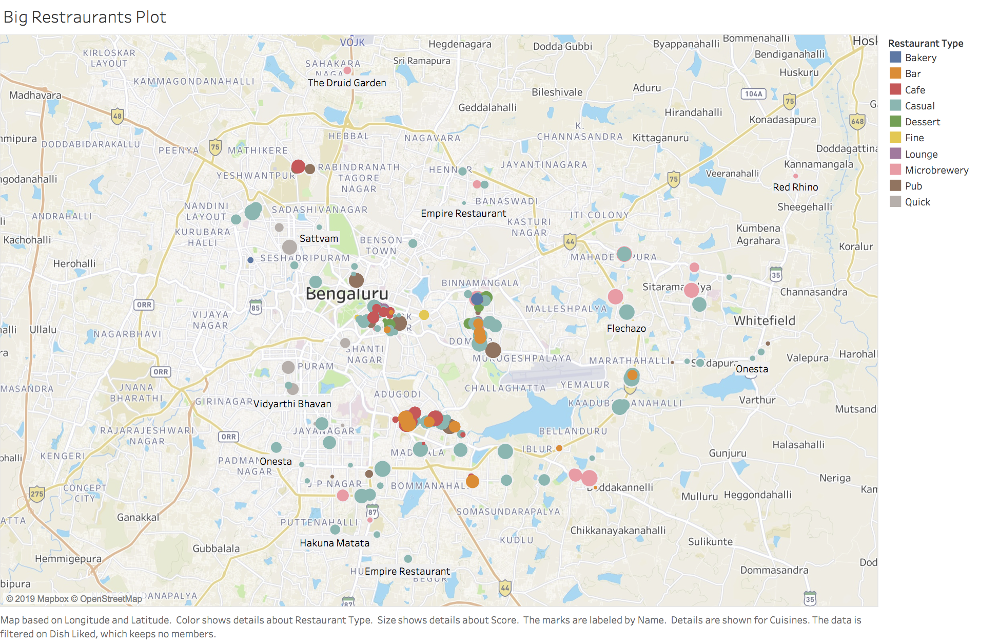

In [190]:
from IPython.display import Image
Image(filename='Tableau.png') 

In [7]:
df2.columns


Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost(for two people)', 'reviews_list', 'menu_item',
       'listed_in(type)', 'listed_in(city)', 'rate_5', 'out_of', 'score',
       'composite_score'],
      dtype='object')

Looking at the features and categorizing them for different types of transformation 

In [191]:
textual_=['reviews_list','rest_type','dish_liked','menu_item','cuisines']
categorical_=['listed_in(type)','location','listed_in(city)']
bin_=['online_order','book_table']
numerical_=['approx_cost(for two people)']


In [192]:
df3=df2[df2.composite_score!=0]

X=df3[textual_+categorical_+bin_+numerical_]


Using __TFIDF__ to extract multi-category and __textual__ features

In [193]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import text 
stop_words = text.ENGLISH_STOP_WORDS.union(['thanks','thank','hi','hello','dear','[]'])
feat=pd.DataFrame()
X=X.fillna(' ')
dict_encoders={}

In [194]:

for x in textual_:
    bow = TfidfVectorizer(max_features=100,min_df=0.0005,max_df=0.4,token_pattern=r'(?u)\b[A-Za-z]+\b', lowercase=True, ngram_range=(1,1),analyzer = "word",stop_words=stop_words)
    print('creating training features for :', x)
    train_in_bow = bow.fit_transform(X[x])
    print('done ! ')
    text_df=pd.DataFrame(train_in_bow.toarray(),columns=bow.get_feature_names())
    text_df.columns=[x+'_'+col for col in text_df.columns]
    if len(feat.index)==0:
        feat=text_df
    else:
        feat=pd.concat([text_df,feat],axis=1)
    
    print(len(text_df))
    dict_encoders[x]=bow

from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(handle_unknown='ignore')
train_cat=enc.fit_transform(X[categorical_])
train_cat=pd.DataFrame(train_cat.toarray(),columns=enc.get_feature_names())
feat=pd.concat([train_cat,feat],axis=1)

X=X.reset_index()
feat=pd.concat([feat,X[numerical_]],axis=1)
dict_encoders['categorical']=enc

for bin_col in bin_:
    feat[bin_col]=[1 if i=='Yes' else 0 for i in X[bin_col] ]


creating training features for : reviews_list
done ! 
41665
creating training features for : rest_type
done ! 
41665
creating training features for : dish_liked
done ! 
41665
creating training features for : menu_item
done ! 
41665
creating training features for : cuisines
done ! 
41665


In [195]:
import numpy as np  
import matplotlib.pyplot as plt  
import seaborn as seabornInstance 
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics


Test Train Split in customary 80/20 ratio, as we treat this as a Regression Problem

In [41]:
#del feat['approx_cost(for two people)']

In [196]:
y=df3.composite_score

feat['approx_cost(for two people)']=pd.to_numeric([str(x).replace(',','').strip() for x in X['approx_cost(for two people)']])
feat.fillna(0,inplace=True)





In [197]:
X_train, X_test, y_train, y_test = train_test_split(feat, y, test_size=0.2, random_state=0)

Using Statsmodel for a statistically sound analysis than scikit-learn

In [198]:
import statsmodels.api as sm      
x_train1 = sm.add_constant(X_train)
x_test1 = sm.add_constant(X_test)

x_train1=x_train1.reset_index(drop=True)
y_train=y_train.reset_index(drop=True)
lm_1 = sm.OLS(y_train, x_train1).fit()
sum_=lm_1.summary()


results_as_html0 = sum_.tables[1].as_html()
results=pd.read_html(results_as_html0, header=0, index_col=0)[0]

results_as_html1 = sum_.tables[0].as_html()
results_0=pd.read_html(results_as_html1, header=0, index_col=0)[0]

results_as_html2 = sum_.tables[2].as_html()
results_1=pd.read_html(results_as_html2, header=0, index_col=0)[0]

In [46]:
results_0



,composite_score,R-squared:,0.801
Dep. Variable:,,,
Model:,OLS,Adj. R-squared:,0.798
Method:,Least Squares,F-statistic:,249.800
Date:,"Fri, 06 Sep 2019",Prob (F-statistic):,0.000
Time:,17:05:15,Log-Likelihood:,-2784.400
No. Observations:,33332,AIC:,6631.000
Df Residuals:,32801,BIC:,11100.000
Df Model:,530,NaN,NaN
Covariance Type:,nonrobust,NaN,NaN


In [49]:
results.sort_values(by=['P>|t|','coef'],ascending=[True,False])

,coef,std err,t,P>|t|,[0.025,0.975]
const,1.7783,0.014,125.521,0.000,1.751,1.806
dish_liked_hyderabadi,0.6003,0.033,18.027,0.000,0.535,0.666
dish_liked_sea,0.5419,0.141,3.836,0.000,0.265,0.819
dish_liked_crispy,0.5389,0.033,16.494,0.000,0.475,0.603
dish_liked_chocolate,0.5272,0.018,29.492,0.000,0.492,0.562
dish_liked_mocktails,0.4953,0.022,22.186,0.000,0.452,0.539
dish_liked_cream,0.4952,0.056,8.826,0.000,0.385,0.605
dish_liked_mutton,0.4813,0.019,25.386,0.000,0.444,0.518
dish_liked_platter,0.4757,0.034,14.174,0.000,0.410,0.541
dish_liked_beef,0.4705,0.030,15.507,0.000,0.411,0.530


__Comments & Inferences :__

1. With R-squared at 80%, the model is a decent one ie. 80% of the variance in dependent variable is expained by the regression.


2. Also, Adj R-sq is quite close to R-squared thus most features are significant in the analysis.


3. Only problem here is high dimensionality of the features which can be solved using non-linear techniques, but this makes model hard to interpret. Other methods are discussed in point #4.


4. Regulatization/ Feature Selection like Ridge or Lasso can reduce dimensionality and make model more articulate and interpretable. But in this case it may hamper accuracy as model is a good fit(not a over-fit).

Lets check model performance for predictions..

In [50]:
from statsmodels.tools.eval_measures import rmse
ypred_trn = lm_1.predict(x_train1)
ypred_tst= lm_1.predict(x_test1)

rmse_train = rmse(y_train, ypred_trn)
rmse_test= rmse(y_test, ypred_tst)

In [51]:
rmse_train

0.26305190008084184

In [52]:
rmse_test


0.2635843597844412

¶ Model Performace is quite decent.

¶ Let us check which are statistically significant variable at 95% confidence.


In [54]:
results.columns
imp_cols=results[results['P>|t|']<0.05].index
imp_cols # quite a many

Index(['const', 'x0_Buffet', 'x0_Cafes', 'x0_Delivery', 'x0_Desserts',
       'x0_Dine-out', 'x0_Drinks & nightlife', 'x0_Pubs and bars', 'x1_BTM',
       'x1_Banashankari',
       ...
       'reviews_list_table', 'reviews_list_tasted', 'reviews_list_times',
       'reviews_list_visited', 'reviews_list_worth', 'reviews_list_yummy',
       'reviews_list_zomato', 'approx_cost(for two people)', 'online_order',
       'book_table'],
      dtype='object', length=339)

In [56]:
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
import sklearn


Let us examine performance of non-linear model like __Random Forest Regression__

In [201]:

reg=RandomForestRegressor(n_jobs=-1)
del x_train1['const']
del x_test1['const']
reg.fit(x_train1,y_train)
prd_rfr=reg.predict(x_train1)

prd_rfr_test=reg.predict(x_test1)
rmse(y_train,prd_rfr)
import sklearn
r2_rf=sklearn.metrics.r2_score(y_train,prd_rfr)


import sklearn.metrics as metrics

def regression_results(y_true, y_pred,col_len):

    # Regression metrics
    explained_variance=metrics.explained_variance_score(y_true, y_pred)
    mean_absolute_error=metrics.mean_absolute_error(y_true, y_pred) 
    mse=metrics.mean_squared_error(y_true, y_pred) 
    mean_squared_log_error=metrics.mean_squared_log_error(y_true, y_pred)
    median_absolute_error=metrics.median_absolute_error(y_true, y_pred)
    r2=metrics.r2_score(y_true, y_pred)
    adjusted_r_squared = 1 - (1-r2)*(len(y)-1)/(len(y)-col_len-1)

    print('explained_variance: ', round(explained_variance,6))    
    print('mean_squared_log_error: ', round(mean_squared_log_error,6))
    print('mean_squared_log_error: ',round(median_absolute_error,6))
    print('r2: ', round(r2,6))
    print('adjusted r2: ', round(adjusted_r_squared,6))
    print('MAE: ', round(mean_absolute_error,6))
    print('MSE: ', round(mse,6))
    print('RMSE: ', round(np.sqrt(mse),6))
    
    
    
regression_results(y_train,prd_rfr,542)
print('____________________________________________________')
print('For Test Data_______________________________________')

regression_results(y_test,prd_rfr_test,542)


/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


explained_variance:  0.989077
mean_squared_log_error:  0.000237
mean_squared_log_error:  0.004646
r2:  0.989074
adjusted r2:  0.98893
MAE:  0.029286
MSE:  0.003808
RMSE:  0.061706
____________________________________________________
For Test Data_______________________________________
explained_variance:  0.943644
mean_squared_log_error:  0.001241
mean_squared_log_error:  0.025731
r2:  0.943595
adjusted r2:  0.942852
MAE:  0.073303
MSE:  0.019517
RMSE:  0.139704


__Comments__: 

1.  Random Forest Regression outperforms OLS linear regression by a hefty margin.
2. R-squared and Adj R-sq at ~98% for training and ~94% shows a great fit of the model, this explains low error rates as well.
3. There is a hint of overfitting, which can be reduced by proper __feature selection__.


__Feature Selection__
1. Using Random Forest - Gini-Based Importance
2. Feature importance using Permutation Importance 


In [71]:
imp_rf=pd.DataFrame(reg.feature_importances_,index=x_train1.columns,columns=['GiniImportance'])
imp_rf.sort_values(by='GiniImportance',ascending=False)

,GiniImportance
book_table,2.725901e-01
dish_liked_chicken,1.341439e-01
reviews_list_nambience,6.727500e-02
dish_liked_chocolate,3.431348e-02
reviews_list_amazing,2.867899e-02
dish_liked_masala,2.337769e-02
dish_liked_pizza,2.079756e-02
reviews_list_table,1.492279e-02
dish_liked_biryani,1.378880e-02
reviews_list_chocolate,1.350140e-02


In [207]:
import eli5
from eli5.sklearn import PermutationImportance

#del x_test
#perm = PermutationImportance(reg, random_state=1).fit(x_train1, y_train)
imp_df=eli5.explain_weights_df(reg,feature_names = x_train1.columns.tolist())


top_feat=imp_df[imp_df['weight']>0.0001]

lm_1 = sm.OLS(y_train, x_train1[top_feat['feature']]).fit()
sum_=lm_1.summary()

results_as_html = sum_.tables[1].as_html()
resultsm=pd.read_html(results_as_html, header=0, index_col=0)[0]

overall_imp=pd.DataFrame([x_train1[x_train1[feat]!=0][feat].mean()*resultsm.loc[feat,'coef'] for feat in resultsm.index],index=resultsm.index,columns=['impact_score'])
#overall_imp=pd.DataFrame([x_train1[feat].mean()*resultsm.loc[feat,'coef'] for feat in resultsm.index],index=resultsm.index,columns=['impact_score'])


__Understanding the impact of each feature:__

We are trying to understand impact of each feature in driving the success (defined by rating and votes) of the restaurant. For this we are defining impact score which is product of mean values of these variables and regression ocefficients. Higher the value higher the contribution of the feature in driving ratings

In [122]:
overall_imp.sort_values(by='impact_score',ascending=False)

,impact_score
rest_type_dining,0.358296
approx_cost(for two people),0.299624
rest_type_quick,0.235177
rest_type_bites,0.235177
online_order,0.147311
rest_type_cafe,0.132135
rest_type_delivery,0.074799
rest_type_shop,0.050250
cuisines_food,0.038147
cuisines_bakery,0.037761


__Recommendations :__

1. Dining Restaurant and Quick Bite type restaurants are successfull in Bangalore.
2. Also, online ordereing have a positive impact on popularity.
3. Expensive restaurants are also doing great. Bangalore has good purchasing power and deep pockets.

In [128]:
overall_imp=pd.merge(overall_imp,top_feat,left_on=overall_imp.index,right_on=top_feat.feature)
del overall_imp['key_0']
overall_imp=pd.merge(overall_imp,resultsm,left_on=overall_imp.feature,right_on=resultsm.index)
del overall_imp['key_0']
#overall_imp=
overall_imp.to_csv('results.csv')

In [129]:

overall_imp.sort_values(by='impact_score',ascending=False)


,impact_score,feature,weight,std,coef,std err,t,P>|t|,[0.025,0.975]
231,1.187146,rest_type_cafe,0.000175,0.000225,1.3145,0.023000,57.134,0.000,1.269,1.360
150,1.180810,rest_type_dining,0.000675,0.000337,1.8592,0.089000,20.853,0.000,1.684,2.034
225,1.168013,rest_type_shop,0.000179,0.000114,1.8816,0.057000,32.764,0.000,1.769,1.994
295,1.153679,rest_type_food,0.000101,0.000075,1.7034,0.028000,61.298,0.000,1.649,1.758
154,1.042305,rest_type_delivery,0.000621,0.000246,1.2395,0.014000,90.003,0.000,1.213,1.267
234,0.929020,rest_type_lounge,0.000170,0.000205,0.9876,0.026000,37.450,0.000,0.936,1.039
181,0.764678,cuisines_bakery,0.000378,0.000205,1.0178,0.019000,54.640,0.000,0.981,1.054
269,0.751356,rest_type_pub,0.000122,0.000163,0.8590,0.024000,36.003,0.000,0.812,0.906
162,0.643589,rest_type_quick,0.000542,0.000343,0.9537,0.006000,149.916,0.000,0.941,0.966
158,0.643589,rest_type_bites,0.000566,0.000238,0.9537,0.006000,149.916,0.000,0.941,0.966


Let us start answering the questions 

 1. __Best Locations:__ 

    Based on coefficients and weightage of locations in the regression, impact of location to the success of retaurant is estimated.
    
    Based on this, it can be said that multiple blocks of __Koramangla, BTM, JP Nagar,HSR,	 Indiranagar Malleshwaram, Jayanagar, Marathalli  etc__ are top locations where foodies flock around, Thus these areas seem to house some of the highest rated and popular retaurants in the city. One can pick location for their new retaurant ventures from below top location based on cost-apetite and competition considerations.
    
    


In [89]:

overall_imp[overall_imp.feature.str.startswith('x1')].sort_values(by='impact_score',ascending=False)

,impact_score,feature,weight,std,coef,std err,t,P>|t|,[0.025,0.975]
172,0.018808,x1_BTM,0.000439,0.000158,0.2008,0.008,23.829,0.000,0.184,0.217
99,0.013471,x1_Koramangala 5th Block,0.001601,0.000858,0.2396,0.010,22.990,0.000,0.219,0.260
190,0.007311,x1_Indiranagar,0.000328,0.000382,0.1641,0.011,14.614,0.000,0.142,0.186
229,0.006686,x1_JP Nagar,0.000177,0.000084,0.1593,0.011,13.927,0.000,0.137,0.182
192,0.006095,x1_HSR,0.000317,0.000191,0.1241,0.011,11.544,0.000,0.103,0.145
179,0.005565,x1_Koramangala 6th Block,0.000381,0.000352,0.2172,0.015,14.883,0.000,0.189,0.246
209,0.005168,x1_Jayanagar,0.000212,0.000150,0.1304,0.012,10.901,0.000,0.107,0.154
288,0.004761,x1_Koramangala 4th Block,0.000110,0.000128,0.2300,0.016,14.236,0.000,0.198,0.262
219,0.004574,x1_Brigade Road,0.000191,0.000159,0.1815,0.015,12.361,0.000,0.153,0.210
268,0.004389,x1_Marathahalli,0.000126,0.000082,0.1271,0.012,10.211,0.000,0.103,0.152


Let us again plot (using googleapi coordinates) these areas and retaurants to reveal some clusters of restaurants:

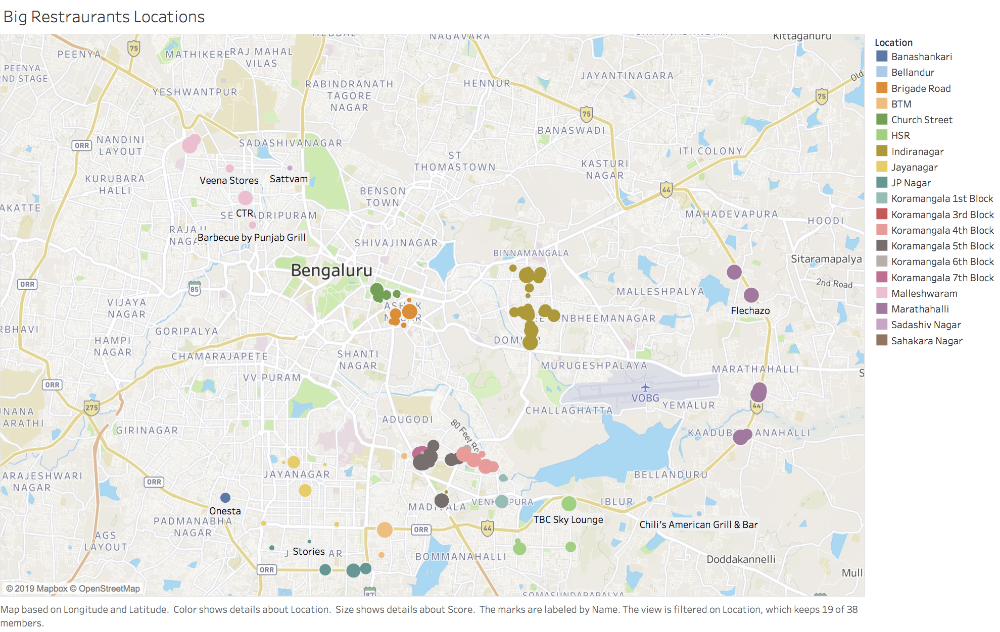

In [118]:
from IPython.display import Image
Image(filename='location.png')

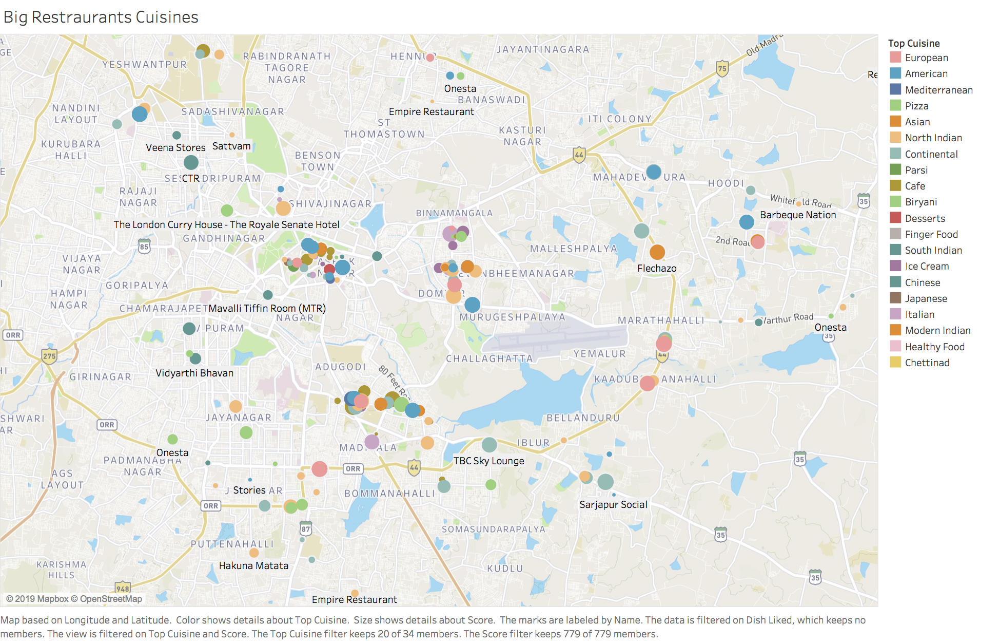

In [119]:

from IPython.display import Image
Image(filename='Cuisines.png')

In [120]:
overall_imp[overall_imp.feature.str.startswith('cuisines')].sort_values(by='impact_score',ascending=False)

,impact_score,feature,weight,std,coef,std err,t,P>|t|,[0.025,0.975]
181,0.764678,cuisines_bakery,0.000378,0.000205,1.0178,0.019,54.640,0.000,0.981,1.054
94,0.259600,cuisines_desserts,0.001632,0.000794,0.4527,0.018,25.520,0.000,0.418,0.488
282,0.215031,cuisines_juices,0.000113,0.000108,0.3132,0.024,12.982,0.000,0.266,0.360
198,0.205884,cuisines_andhra,0.000275,0.000122,0.2674,0.017,16.180,0.000,0.235,0.300
196,0.202687,cuisines_bbq,0.000280,0.000322,0.3170,0.028,11.427,0.000,0.263,0.371
136,0.201413,cuisines_south,0.000893,0.000293,0.2926,0.010,28.231,0.000,0.272,0.313
186,0.193803,cuisines_momos,0.000347,0.000201,0.3000,0.024,12.696,0.000,0.254,0.346
247,0.187463,cuisines_ice,0.000146,0.000119,0.3170,0.015,21.701,0.000,0.288,0.346
274,0.187463,cuisines_cream,0.000118,0.000141,0.3170,0.015,21.701,0.000,0.288,0.346
205,0.182541,cuisines_kerala,0.000221,0.000211,0.2411,0.019,12.823,0.000,0.204,0.278


__II. Best Cuisines__ :  
 
Based on the regression coefficient and our impact score,the bakeries are clear winners in bangalore, with distinctly high scores. One can say your ratings of 5 will be '+1' at an average than others given you are a bakery listed in Zomato.

Bakery, Desserts, Juices and other western style cuisines are trending favourites. While, South Indian cuisines like Andhra ,Kerala are also well-rated. 

In the above plots, it can be noted areas like Koramangala, MG Road etc have majorily european/american style cafe,pubs and dine-outs. While, southern and western areas of the city like Malleshwaram, JP Nagar, Jaya Nagar are dominated by more traditional Indian-cuisine restaurants. Other eastern areas like Indiranagar, Marathalli etc have good mix of things.


__III.  Ranking of Restaurant using Model Weights__:

Here we can use random forest to predict score of the restaurants. Based on this we can rank restaurants based on review features. We chose random forest for prediction and ranking task because of lower error rate and higher explained varaince than OLS linear regression.

Let us find predicted scores of the test set restaurants and rank them: 

In [247]:
x_test1=x_test1.loc[list(set(x_test1.index).intersection(set(df3.index))),:]

In [248]:
del x_test1['const']

Running Random Forest Regression to predict scores

In [264]:
test_pred=reg.predict(x_test1)

In [250]:
x_test1['name']=df3.loc[x_test1.index,'name']

In [251]:
x_test1['location']=df3.loc[x_test1.index,'location']

In [252]:
x_test1['cuisines']=df3.loc[x_test1.index,'cuisines']

In [233]:
test_pred=test_pred.reset_index(drop=True)
x_test1=x_test1.reset_index(drop=True)

In [257]:
test_pred=pd.DataFrame(test_pred,columns=['predict_score'])

In [258]:
test_data=pd.concat([test_pred,x_test1],axis=1)

In [259]:
test_data.columns=['restaurant_score']+list(x_test1.columns)

In [261]:
test_data[['name','location','cuisines','restaurant_score',]].sort_values(by='restaurant_score',ascending=False).dropna()



,name,location,cuisines,restaurant_score
739,Tasty Bites,Banashankari,"Fast Food, Pizza",4.747497
6546,Hotel Nisarga Grand,City Market,"South Indian, North Indian, Chinese",4.747497
1337,Big Mishra Pedha,Bannerghatta Road,"Mithai, Desserts, Fast Food",4.747409
4378,Chination,Sarjapur Road,Chinese,4.620395
5124,Dunkin' Donuts,Brigade Road,"Burger, Desserts, Fast Food",4.586660
2769,Shringar Sweets & Snacks,Basavanagudi,"Mithai, South Indian, Street Food, Fast Food",4.531508
5946,The Permit Room,Brigade Road,South Indian,4.507813
2547,Empire Restaurant,Jayanagar,"North Indian, Mughlai, South Indian, Chinese",4.507813
2671,Sri Sai Cafe,Basavanagudi,South Indian,4.480125
3160,Sk Grand Hotel,Jayanagar,South Indian,4.462547


According to analysis, the top names in the listed restaurants from test data will be very sucessfully. 